In [35]:
import os
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# mlp for multi-label classification
from numpy import mean
from numpy import std
from sklearn.datasets import make_multilabel_classification
from sklearn.model_selection import RepeatedKFold

from tensorflow.keras import layers


In [36]:
df = pd.read_csv("outfits.csv")
df.head()

,id,name_1,img_route_1,cloth_category_1,cloth_subcategory_1,patron_1,sleeve_1,skirt_1,neckline_1,material_1,...,skirt_6,neckline_6,material_6,fit_6,isCold_6,isRainy_6,isWet_6,isTempered_6,isHot_6,nota_6
0,51,Lace-Paneled Lattice-Back Blouse,Lace-Paneled_Lattice-Back_Blouse/img_00000051.jpg,1,1,6,3,3,4,3,...,3,4,3,3,0,0,0,1,1,4
1,52,Embroidered Mesh Gauze Blouse,Embroidered_Mesh_Gauze_Blouse/img_00000027.jpg,1,1,4,1,3,2,2,...,3,4,1,1,0,0,0,1,1,2
2,53,Belted Crop Top,Belted_Crop_Top/img_00000011.jpg,1,7,6,2,3,1,2,...,3,4,1,1,1,1,1,1,1,4
3,54,Embroidered Bead Keyhole Blouse,Embroidered_Bead_Keyhole_Blouse/img_00000056.jpg,1,1,4,2,3,1,3,...,3,4,3,1,0,0,0,1,0,5
4,55,Collared Surplice Blouse,Collared_Surplice_Blouse/img_00000094.jpg,1,1,6,2,3,1,3,...,3,4,1,3,0,0,1,1,0,5


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 873 entries, 0 to 872
Data columns (total 97 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   id                   873 non-null    int64 
 1   name_1               873 non-null    object
 2   img_route_1          873 non-null    object
 3   cloth_category_1     873 non-null    int64 
 4   cloth_subcategory_1  873 non-null    int64 
 5   patron_1             873 non-null    int64 
 6   sleeve_1             873 non-null    int64 
 7   skirt_1              873 non-null    int64 
 8   neckline_1           873 non-null    int64 
 9   material_1           873 non-null    int64 
 10  fit_1                873 non-null    int64 
 11  isCold_1             873 non-null    int64 
 12  isRainy_1            873 non-null    int64 
 13  isWet_1              873 non-null    int64 
 14  isTempered_1         873 non-null    int64 
 15  isHot_1              873 non-null    int64 
 16  nota_1  

In [38]:
drops = [
    "id",
    "name_1", "img_route_1",
    "name_2", "img_route_2",
    "name_3", "img_route_3",
    "name_4", "img_route_4",
    "name_5", "img_route_5",
    "name_6", "img_route_6"
]
df2 = df.drop(drops, axis = 1)

In [39]:
df_target = pd.read_csv("outfit_target.csv")

In [40]:
df_target.head()

,isCold,isRainy,isWet,isTempered,isHot,nota
51,1,1,1,1,1,1
52,0,0,0,1,1,4
53,0,0,0,1,1,4
54,0,0,0,1,1,4
55,0,0,1,1,0,3


c:\Users\Sebastian\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


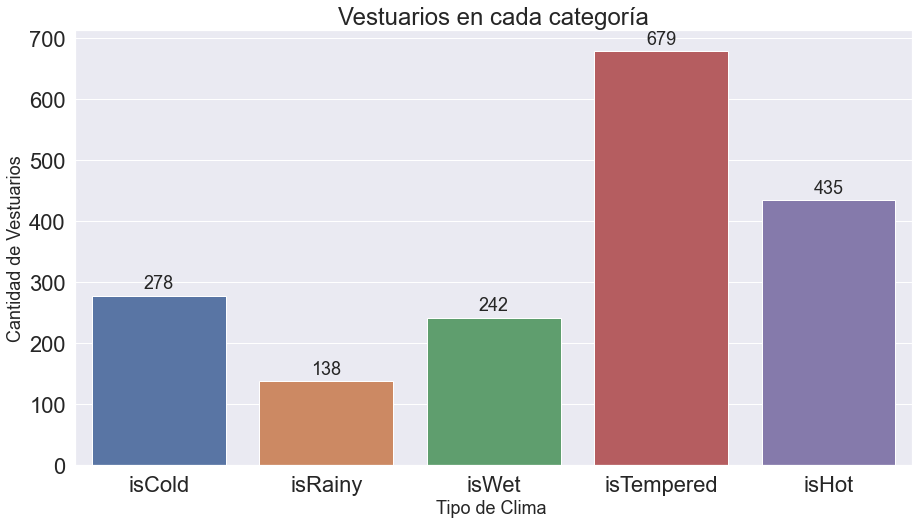

In [41]:
categories = list(df_target.columns.values)[:5]
sns.set(font_scale = 2)
plt.figure(figsize=(15,8))
ax= sns.barplot(categories, df_target.iloc[:,:5].sum().values)
plt.title("Vestuarios en cada categoría", fontsize=24)
plt.ylabel('Cantidad de Vestuarios', fontsize=18)
plt.xlabel('Tipo de Clima ', fontsize=18)#adding the text labels
rects = ax.patches
labels = df_target.iloc[:,:5].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize=18)
plt.show()

In [12]:
# Graficar la frecuencia de cada valor de variable para cada variable.
"""
for column in df2.columns:
    plt.figure(figsize=(8,4))
    sns.countplot(x=column ,data=df2, palette="rainbow")
    plt.xticks(rotation=90)
    plt.show()
"""

'\nfor column in df2.columns:\n    plt.figure(figsize=(8,4))\n    sns.countplot(x=column ,data=df2, palette="rainbow")\n    plt.xticks(rotation=90)\n    plt.show()\n'

Una vez analizados los gráficos, se determinó eliminar las siguientes columnas como entradas para la red neuronal, debido a que su frecuencia no estaba justificada o existía correlación entre atributos.

In [9]:
# variables_continuas = ["nota_1", "nota_2", "nota_3", "nota_4", "nota_5", "nota_6"]
# notas_df = df2[variables_continuas].copy()

# df2 = df2.drop(variables_continuas, axis=1)

In [10]:
# notas_df

,nota_1,nota_2,nota_3,nota_4,nota_5,nota_6
0,4,4,4,0,5,4
1,3,0,0,0,5,2
2,5,5,0,3,5,4
3,3,0,0,3,3,5
4,1,0,0,2,3,5
...,...,...,...,...,...,...
868,3,0,4,0,3,4
869,4,0,5,0,4,3
870,1,5,0,2,5,2
871,3,0,0,0,2,4


In [93]:
# from sklearn.preprocessing import MinMaxScaler
# import joblib


In [94]:
# labels = notas_df.columns
# scaler = MinMaxScaler()
# notas_df = pd.DataFrame(scaler.fit_transform(notas_df)) # ,index= data_continua.index.values,)
# notas_df.columns = labels
# notas_df

,nota_1,nota_2,nota_3,nota_4,nota_5,nota_6
0,0.75,0.8,0.8,0.00,1.000000,0.75
1,0.50,0.0,0.0,0.00,1.000000,0.25
2,1.00,1.0,0.0,0.75,1.000000,0.75
3,0.50,0.0,0.0,0.75,0.333333,1.00
4,0.00,0.0,0.0,0.50,0.333333,1.00
...,...,...,...,...,...,...
868,0.50,0.0,0.8,0.00,0.333333,0.75
869,0.75,0.0,1.0,0.00,0.666667,0.50
870,0.00,1.0,0.0,0.50,1.000000,0.25
871,0.50,0.0,0.0,0.00,0.000000,0.75


In [95]:
# scaler_filename = "scaler.save"
# joblib.dump(scaler, scaler_filename) 

In [42]:
def getDummiesForEveryVariable(df):
    dummied_columns = []
    for column in df.columns:
        dummied_columns.append( pd.get_dummies( df[column], prefix = column) )
    dummied_columns = pd.concat( dummied_columns, axis = 1, join = 'inner')
    return dummied_columns

dummied_df = getDummiesForEveryVariable(df2)

In [43]:
dummied_df

,cloth_category_1_1,cloth_subcategory_1_1,cloth_subcategory_1_2,cloth_subcategory_1_4,cloth_subcategory_1_5,cloth_subcategory_1_6,cloth_subcategory_1_7,cloth_subcategory_1_8,cloth_subcategory_1_9,patron_1_1,...,isWet_6_1,isTempered_6_0,isTempered_6_1,isHot_6_0,isHot_6_1,nota_6_1,nota_6_2,nota_6_3,nota_6_4,nota_6_5
0,1,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,1,0
1,1,1,0,0,0,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
2,1,0,0,0,0,0,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0
3,1,1,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,1,0,0,0,1,0
869,1,0,0,1,0,0,0,0,0,0,...,1,0,1,0,1,0,0,1,0,0
870,1,0,0,0,1,0,0,0,0,0,...,0,0,1,0,1,0,1,0,0,0
871,1,0,0,0,0,0,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0


In [41]:
for c in dummied_df.columns:
    print(c)

cloth_category_1_1
cloth_subcategory_1_1
cloth_subcategory_1_2
cloth_subcategory_1_4
cloth_subcategory_1_5
cloth_subcategory_1_6
cloth_subcategory_1_7
cloth_subcategory_1_8
cloth_subcategory_1_9
patron_1_1
patron_1_2
patron_1_3
patron_1_4
patron_1_5
patron_1_6
patron_1_7
sleeve_1_1
sleeve_1_2
sleeve_1_3
skirt_1_1
skirt_1_2
skirt_1_3
neckline_1_1
neckline_1_2
neckline_1_3
neckline_1_4
material_1_1
material_1_2
material_1_3
material_1_4
material_1_5
material_1_6
fit_1_1
fit_1_2
fit_1_3
isCold_1_0
isCold_1_1
isRainy_1_0
isRainy_1_1
isWet_1_0
isWet_1_1
isTempered_1_0
isTempered_1_1
isHot_1_0
isHot_1_1
nota_1_1
nota_1_2
nota_1_3
nota_1_4
nota_1_5
cloth_category_2_0
cloth_category_2_2
cloth_subcategory_2_0
cloth_subcategory_2_1
cloth_subcategory_2_2
cloth_subcategory_2_3
cloth_subcategory_2_4
cloth_subcategory_2_5
patron_2_0
patron_2_1
patron_2_2
patron_2_3
patron_2_4
patron_2_5
patron_2_6
patron_2_7
sleeve_2_0
sleeve_2_1
sleeve_2_2
sleeve_2_3
skirt_2_0
skirt_2_1
skirt_2_3
neckline_2_0
neckl

In [44]:
COLUMNAS_ELIMINADAS = ["nota_2_0", "nota_3_0", "nota_4_0"]

In [99]:
# print('Columna\t','# de Ocurrencias')
# remove = []
# for col in dummied_df:
    # count= 0
    # 
    # if(len(dummied_df[col].value_counts()) >1):
        # count = dummied_df[col].value_counts()[1]
        # 
    # if count < 75:
        # print(col,'\t',count)
        # remove.append(col)
# 
# dummied_df.drop(remove, axis = 1, inplace = True)


Columna	 # de Ocurrencias
cloth_category_1_1 	 0
cloth_subcategory_1_2 	 1
cloth_subcategory_1_4 	 9
cloth_subcategory_1_8 	 2
cloth_subcategory_1_9 	 2
patron_1_3 	 68
patron_1_4 	 45
patron_1_5 	 6
patron_1_7 	 17
skirt_1_1 	 4
skirt_1_2 	 9
neckline_1_3 	 2
material_1_1 	 6
material_1_4 	 3
material_1_5 	 2
material_1_6 	 25
fit_1_1 	 58
fit_1_2 	 53
isRainy_1_1 	 31
cloth_subcategory_2_3 	 58
cloth_subcategory_2_4 	 7
patron_2_1 	 32
patron_2_2 	 60
patron_2_3 	 37
patron_2_4 	 20
patron_2_5 	 2
patron_2_7 	 10
sleeve_2_2 	 33
sleeve_2_3 	 28
skirt_2_1 	 1
neckline_2_3 	 1
material_2_1 	 4
material_2_2 	 16
material_2_4 	 9
material_2_5 	 12
fit_2_1 	 8
fit_2_2 	 29
isRainy_2_1 	 71
cloth_subcategory_3_1 	 5
cloth_subcategory_3_2 	 15
cloth_subcategory_3_4 	 14
cloth_subcategory_3_6 	 34
patron_3_1 	 30
patron_3_2 	 40
patron_3_3 	 5
patron_3_4 	 20
patron_3_7 	 8
sleeve_3_2 	 19
sleeve_3_3 	 26
skirt_3_2 	 1
neckline_3_4 	 27
material_3_1 	 32
material_3_2 	 13
material_3_5 	 50
m

In [45]:

renames = {}
for c in dummied_df.columns.values:
    if c.split("_")[0] in ["isCold", "isRainy", "isWet", "isTempered", "isHot"]:
        if c[-1] == "1":
            COLUMNAS_ELIMINADAS.append( c )
        else:
            renames[c] = c.replace("_0", "")

In [17]:
COLUMNAS_ELIMINADAS

['nota_2_0',
 'nota_3_0',
 'nota_4_0',
 'isCold_1_1',
 'isRainy_1_1',
 'isWet_1_1',
 'isTempered_1_1',
 'isHot_1_1',
 'isCold_2_1',
 'isRainy_2_1',
 'isWet_2_1',
 'isTempered_2_1',
 'isHot_2_1',
 'isCold_3_1',
 'isRainy_3_1',
 'isWet_3_1',
 'isTempered_3_1',
 'isHot_3_1',
 'isCold_4_1',
 'isRainy_4_1',
 'isTempered_4_1',
 'isHot_4_1',
 'isCold_5_1',
 'isRainy_5_1',
 'isWet_5_1',
 'isTempered_5_1',
 'isHot_5_1',
 'isCold_6_1',
 'isRainy_6_1',
 'isWet_6_1',
 'isTempered_6_1',
 'isHot_6_1']

In [18]:
renames

{'isCold_1_0': 'isCold_1',
 'isRainy_1_0': 'isRainy_1',
 'isWet_1_0': 'isWet_1',
 'isTempered_1_0': 'isTempered_1',
 'isHot_1_0': 'isHot_1',
 'isCold_2_0': 'isCold_2',
 'isRainy_2_0': 'isRainy_2',
 'isWet_2_0': 'isWet_2',
 'isTempered_2_0': 'isTempered_2',
 'isHot_2_0': 'isHot_2',
 'isCold_3_0': 'isCold_3',
 'isRainy_3_0': 'isRainy_3',
 'isWet_3_0': 'isWet_3',
 'isTempered_3_0': 'isTempered_3',
 'isHot_3_0': 'isHot_3',
 'isCold_4_0': 'isCold_4',
 'isRainy_4_0': 'isRainy_4',
 'isWet_4_0': 'isWet_4',
 'isTempered_4_0': 'isTempered_4',
 'isHot_4_0': 'isHot_4',
 'isCold_5_0': 'isCold_5',
 'isRainy_5_0': 'isRainy_5',
 'isWet_5_0': 'isWet_5',
 'isTempered_5_0': 'isTempered_5',
 'isHot_5_0': 'isHot_5',
 'isCold_6_0': 'isCold_6',
 'isRainy_6_0': 'isRainy_6',
 'isWet_6_0': 'isWet_6',
 'isTempered_6_0': 'isTempered_6',
 'isHot_6_0': 'isHot_6'}

In [19]:
dummied_df.drop(COLUMNAS_ELIMINADAS, axis = 1, inplace = True)
dummied_df.rename(columns=renames, inplace = True)

In [46]:
dummied_df.rename(columns=renames, inplace = True)

In [15]:
"""
yet_more_drops = [
    'skirt_1_3',
    'fit_1_3',
    'cloth_subcategory_2_0',
    'patron_2_0',
    'sleeve_2_0',
    'sleeve_2_1',
    'skirt_2_0',
    'skirt_2_3',
    'neckline_2_0',
    'material_2_0',
    'fit_2_0',
    'fit_2_3',
    'cloth_subcategory_3_0',
    'cloth_subcategory_3_3',
    'patron_3_0',
    'patron_3_6',
    'sleeve_3_0',
    'sleeve_3_1',
    'skirt_3_0',
    'skirt_3_3',
    'neckline_3_0',
    'material_3_0',
    'fit_3_0',
    'fit_3_3',
    'cloth_subcategory_4_0',
    'cloth_subcategory_4_7',
    'patron_4_0',
    'patron_4_6',
    'material_4_0',
    'fit_4_0',
    'sleeve_6_3',
    'skirt_6_3',
    'neckline_6_4'
]
"""

"\nyet_more_drops = [\n    'skirt_1_3',\n    'fit_1_3',\n    'cloth_subcategory_2_0',\n    'patron_2_0',\n    'sleeve_2_0',\n    'sleeve_2_1',\n    'skirt_2_0',\n    'skirt_2_3',\n    'neckline_2_0',\n    'material_2_0',\n    'fit_2_0',\n    'fit_2_3',\n    'cloth_subcategory_3_0',\n    'cloth_subcategory_3_3',\n    'patron_3_0',\n    'patron_3_6',\n    'sleeve_3_0',\n    'sleeve_3_1',\n    'skirt_3_0',\n    'skirt_3_3',\n    'neckline_3_0',\n    'material_3_0',\n    'fit_3_0',\n    'fit_3_3',\n    'cloth_subcategory_4_0',\n    'cloth_subcategory_4_7',\n    'patron_4_0',\n    'patron_4_6',\n    'material_4_0',\n    'fit_4_0',\n    'sleeve_6_3',\n    'skirt_6_3',\n    'neckline_6_4'\n]\n"

In [108]:
# dummied_df.drop(yet_more_drops, axis = 1, inplace = True)
#for c in dummied_df.columns:
#    print(c)

cloth_subcategory_1_1
cloth_subcategory_1_5
cloth_subcategory_1_6
cloth_subcategory_1_7
patron_1_1
patron_1_2
patron_1_6
sleeve_1_1
sleeve_1_2
sleeve_1_3
neckline_1_1
neckline_1_2
neckline_1_4
material_1_2
material_1_3
isCold_1
isRainy_1
isWet_1
isTempered_1
isHot_1
cloth_category_2_0
cloth_category_2_2
cloth_subcategory_2_1
cloth_subcategory_2_2
cloth_subcategory_2_5
patron_2_6
neckline_2_1
neckline_2_2
neckline_2_4
material_2_3
material_2_6
isCold_2
isRainy_2
isWet_2
isTempered_2
isHot_2
cloth_category_3_0
cloth_category_3_3
neckline_3_1
neckline_3_2
material_3_3
material_3_4
isCold_3
isRainy_3
isWet_3
isTempered_3
isHot_3
cloth_category_4_0
cloth_category_4_4
material_4_5
material_4_6
fit_4_1
fit_4_2
isCold_4
isRainy_4
isTempered_4
isHot_4
cloth_subcategory_5_8
cloth_subcategory_5_9
cloth_subcategory_5_11
patron_5_0
patron_5_6
material_5_0
material_5_4
fit_5_1
fit_5_2
fit_5_3
isCold_5
isRainy_5
isWet_5
isTempered_5
isHot_5
cloth_subcategory_6_2
cloth_subcategory_6_3
cloth_subcategor

In [41]:
# x = pd.concat( [notas_df, dummied_df], axis = 1, join = 'inner')
for c in dummied_df.columns:
    print(c)

cloth_category_1_1
cloth_subcategory_1_1
cloth_subcategory_1_2
cloth_subcategory_1_4
cloth_subcategory_1_5
cloth_subcategory_1_6
cloth_subcategory_1_7
cloth_subcategory_1_8
cloth_subcategory_1_9
patron_1_1
patron_1_2
patron_1_3
patron_1_4
patron_1_5
patron_1_6
patron_1_7
sleeve_1_1
sleeve_1_2
sleeve_1_3
skirt_1_1
skirt_1_2
skirt_1_3
neckline_1_1
neckline_1_2
neckline_1_3
neckline_1_4
material_1_1
material_1_2
material_1_3
material_1_4
material_1_5
material_1_6
fit_1_1
fit_1_2
fit_1_3
isCold_1
isRainy_1
isWet_1
isTempered_1
isHot_1
nota_1_1
nota_1_2
nota_1_3
nota_1_4
nota_1_5
cloth_category_2_0
cloth_category_2_2
cloth_subcategory_2_0
cloth_subcategory_2_1
cloth_subcategory_2_2
cloth_subcategory_2_3
cloth_subcategory_2_4
cloth_subcategory_2_5
patron_2_0
patron_2_1
patron_2_2
patron_2_3
patron_2_4
patron_2_5
patron_2_6
patron_2_7
sleeve_2_0
sleeve_2_1
sleeve_2_2
sleeve_2_3
skirt_2_0
skirt_2_1
skirt_2_3
neckline_2_0
neckline_2_1
neckline_2_2
neckline_2_3
neckline_2_4
material_2_0
material

In [20]:
x = dummied_df

In [21]:
x

,cloth_category_1_1,cloth_subcategory_1_1,cloth_subcategory_1_2,cloth_subcategory_1_4,cloth_subcategory_1_5,cloth_subcategory_1_6,cloth_subcategory_1_7,cloth_subcategory_1_8,cloth_subcategory_1_9,patron_1_1,...,isCold_6,isRainy_6,isWet_6,isTempered_6,isHot_6,nota_6_1,nota_6_2,nota_6_3,nota_6_4,nota_6_5
0,1,1,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,0,0,1,0
1,1,1,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,1,0,0,0
2,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,1,1,0,0,0,0,0,0,0,0,...,1,1,1,0,1,0,0,0,0,1
4,1,1,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
868,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,0,1,0
869,1,0,0,1,0,0,0,0,0,0,...,1,1,0,0,0,0,0,1,0,0
870,1,0,0,0,1,0,0,0,0,0,...,1,1,1,0,0,0,1,0,0,0
871,1,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,0


In [49]:
nota = ["nota"]
nota_target_df = df_target[nota].copy()

df_target = df_target.drop(nota, axis=1)

In [50]:
nota_target_dummied_df = getDummiesForEveryVariable(nota_target_df)
nota_target_dummied_df

,nota_1,nota_2,nota_3,nota_4,nota_5
51,1,0,0,0,0
52,0,0,0,1,0
53,0,0,0,1,0
54,0,0,0,1,0
55,0,0,1,0,0
...,...,...,...,...,...
996,0,0,1,0,0
997,0,0,1,0,0
998,0,0,1,0,0
999,0,1,0,0,0


In [51]:
y = pd.concat( [df_target, nota_target_dummied_df], axis = 1, join = 'inner')
y

,isCold,isRainy,isWet,isTempered,isHot,nota_1,nota_2,nota_3,nota_4,nota_5
51,1,1,1,1,1,1,0,0,0,0
52,0,0,0,1,1,0,0,0,1,0
53,0,0,0,1,1,0,0,0,1,0
54,0,0,0,1,1,0,0,0,1,0
55,0,0,1,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...
996,1,0,0,1,0,0,0,1,0,0
997,1,1,1,1,1,0,0,1,0,0
998,1,0,0,1,1,0,0,1,0,0
999,0,0,0,1,1,0,1,0,0,0


In [25]:
x = x.to_numpy()
y = y.to_numpy()

In [227]:
x.shape

(873, 216)

In [27]:
y.shape

(873, 10)

In [57]:
# graficar metricas
def plot(info):

    fig, axs = plt.subplots(2,2)
    fig.suptitle('Clasificación de climas y nota promedio')
    
    axs[0, 0].set_ylabel('loss')
    axs[0, 0].plot(info["climas_loss"])
    axs[0, 0].plot(info["val_climas_loss"])
    axs[0, 0].legend(loc=2, prop={'size': 6})


    axs[1, 0].set_ylabel('accuracy')
    axs[1, 0].plot(info["climas_accuracy"])
    axs[1, 0].plot(info["val_climas_accuracy"])

    axs[0, 1].set_ylabel('loss')
    axs[0, 1].plot(info["nota_loss"])
    axs[0, 1].plot(info["val_nota_loss"])


    axs[1, 1].set_ylabel('accuracy')
    axs[1, 1].plot(info["nota_accuracy"])
    axs[1, 1].plot(info["val_nota_accuracy"])

    fig.legend(['train', 'val'], loc='center right')

    for ax in axs.flat:
        ax.set(xlabel='epoch')
    
    for ax in axs.flat:
        ax.label_outer()

    plt.show()
    
# obtener promedio de cada métrica por epoch para graficar las medias de cada epoch
def plot_avg(info):
    data = ["loss", "val_loss", "climas_loss", "val_climas_loss", "nota_loss", "val_nota_loss", "climas_accuracy", "val_climas_accuracy", "nota_accuracy", "val_nota_accuracy"] 
    infos = {}
    for label in data:
        infos[label] = []

    # mean_loss_by_epoch = []
    # mean_val_loss_by_epoch = []
    # mean_acc_by_epoch = []
    # mean_val_acc_by_epoch = []

    i = 0
    for epoch in range(len(info[i].history["loss"])):
        
        tmp = {}
        for label in data:
            tmp[f"epoch_i_{label}"] = []

        # epoch_i_loss = []
        # epoch_i_val_loss = []
        # epoch_i_acc = []
        # epoch_i_val_acc = []
        
        # print("e:",epoch)
        for j in range(len(info)):
            # print("j:",j)
            for label in data:
                tmp[f"epoch_i_{label}"].append( info[j].history[label][epoch] )
            
            # epoch_i_loss.append( info[j].history["loss"][epoch] )
            # epoch_i_val_loss.append( info[j].history["val_loss"][epoch] )
            # epoch_i_acc.append( info[j].history["accuracy"][epoch] )
            # epoch_i_val_acc.append( info[j].history["val_accuracy"][epoch] )
        
        for label in data:
            infos[label].append( mean( tmp[f"epoch_i_{label}"] ) )

        # mean_loss_by_epoch.append( mean(epoch_i_loss) )
        # mean_val_loss_by_epoch.append( mean(epoch_i_val_loss) )
        # mean_acc_by_epoch.append( mean(epoch_i_acc) )
        # mean_val_acc_by_epoch.append( mean(epoch_i_val_acc) )
    # print(info)
    plot(infos)

In [31]:
# evaluar modelo usando k-fold cross-validation repetidamente
def evaluate_model(model, X, y, flag = False):
	infos = list()
	
	# definir KFold
	cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
	# enumerar los folds
	for train_ix, val_ix in cv.split(X):
		# separar data
		X_train, X_val = X[train_ix], X[val_ix]
		y_train, y_val = y[train_ix], y[val_ix]
		
		# early_stopping
		if flag:
		
			filepath = "/modelos/saved-model_{epoch}.hdf5"

			model_checkpoint_callback = ModelCheckpoint(
			    filepath,
			    monitor="val_loss",
			    verbose=0,
			    save_best_only=False,
			    save_weights_only=False,
			    mode="auto",
			    save_freq="epoch"
			)

			callbacks_list = [model_checkpoint_callback, EarlyStopping(patience=5, monitor="val_loss", restore_best_weights=True)]

			info = model.fit(X_train, [y_train[:, :5], y_train[:, 5:]], verbose=2, epochs=100, validation_data=(X_val, [y_val[:, :5], y_val[:, 5:]]), callbacks=callbacks_list)
		
		# fittear modelo
		info = model.fit(X_train, [y_train[:, :5], y_train[:, 5:]], verbose=2, epochs=100, validation_data=(X_val, [y_val[:, :5], y_val[:, 5:]]) ) #, callbacks=callbacks_list)
		infos.append(info)
	return infos

In [130]:
# generar modelo
def get_model_1(n_inputs, n_outputs, name = "all_columns_FF"):
	# p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs,), name=name)
	
	hlayer1 = layers.Dense(250, activation='relu')(inputs)
	hlayer2 = layers.Dense(100, activation='relu')(hlayer1)
	hlayer3 = layers.Dense(50, activation='relu')(hlayer2)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer3)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer3)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model
	"""

	model = Sequential()
	model.add(Dense(70, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(70,)))

	# model.add(Dense(30, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dense(30, input_dim=70, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(30,)))

	model.add(Dense(10, input_dim=30, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(10,)))

	model.add(Dense(n_outputs, activation='sigmoid'))
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics="accuracy")
	model.summary()
	"""

In [217]:
def get_modelo_final(n_inputs, n_outputs, name):
    inputs = keras.Input(shape=(n_inputs,), name=name)
    
    hlayer1 = layers.Dense(200, activation='relu')(inputs)
    hlayer2 = layers.Dense(100, activation='relu')(hlayer1)
    hlayer3=layers.Dropout(0.2)(hlayer2)
    hlayer4 = layers.Dense(50, activation='relu')(hlayer3)

    categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer4)
    nota = Dense(5, activation='sigmoid', name='nota')(hlayer4)

    model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
    model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
    model.summary()
    keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

    return model
#

In [218]:
modelo = get_modelo_final(n_inputs, n_outputs, "RedNeuronal")

Model: "RedNeuronal"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 RedNeuronal (InputLayer)       [(None, 216)]        0           []                               
                                                                                                  
 dense_59 (Dense)               (None, 200)          43400       ['RedNeuronal[0][0]']            
                                                                                                  
 dense_60 (Dense)               (None, 100)          20100       ['dense_59[0][0]']               
                                                                                                  
 dropout_20 (Dropout)           (None, 100)          0           ['dense_60[0][0]']               
                                                                                        

In [219]:
info = evaluate_model(modelo, x, y)

Epoch 1/100
25/25 - 2s - loss: 2.2227 - climas_loss: 0.6217 - nota_loss: 1.6010 - climas_accuracy: 0.4357 - nota_accuracy: 0.2217 - val_loss: 2.1908 - val_climas_loss: 0.5829 - val_nota_loss: 1.6080 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.1705 - 2s/epoch - 65ms/step
Epoch 2/100
25/25 - 0s - loss: 2.0802 - climas_loss: 0.5666 - nota_loss: 1.5136 - climas_accuracy: 0.4599 - nota_accuracy: 0.3108 - val_loss: 2.1023 - val_climas_loss: 0.5667 - val_nota_loss: 1.5356 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2727 - 107ms/epoch - 4ms/step
Epoch 3/100
25/25 - 0s - loss: 1.9826 - climas_loss: 0.5553 - nota_loss: 1.4273 - climas_accuracy: 0.4561 - nota_accuracy: 0.3822 - val_loss: 1.9917 - val_climas_loss: 0.5527 - val_nota_loss: 1.4391 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.3295 - 95ms/epoch - 4ms/step
Epoch 4/100
25/25 - 0s - loss: 1.8959 - climas_loss: 0.5402 - nota_loss: 1.3557 - climas_accuracy: 0.4561 - nota_accuracy: 0.4140 - val_loss: 1.9530 - val_cl

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


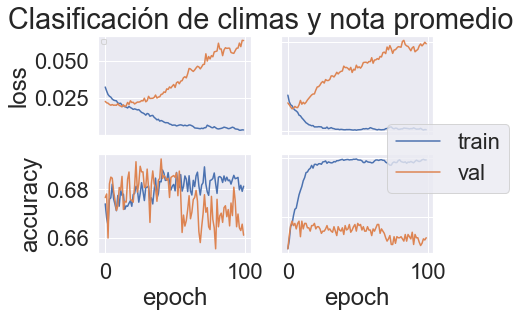

In [220]:
plot_avg(info)

In [221]:
def get_modelo_final_final(n_inputs, n_outputs, name):
    inputs = keras.Input(shape=(n_inputs,), name=name)
    
    hlayer1 = layers.Dense(200, activation='relu')(inputs)
    hlayer2 = layers.Dropout(0.2)(hlayer1)
    hlayer3 = layers.Dense(100, activation='relu')(hlayer2)
    hlayer4=layers.Dropout(0.2)(hlayer3)
    hlayer5 = layers.Dense(50, activation='relu')(hlayer4)

    categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer5)
    nota = Dense(5, activation='sigmoid', name='nota')(hlayer4)

    model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
    model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
    model.summary()
    keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

    return model

In [222]:
modelo_final_final = get_modelo_final_final(n_inputs, n_outputs, "FF_Dropout")

Model: "FF_Dropout"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF_Dropout (InputLayer)        [(None, 216)]        0           []                               
                                                                                                  
 dense_62 (Dense)               (None, 200)          43400       ['FF_Dropout[0][0]']             
                                                                                                  
 dropout_21 (Dropout)           (None, 200)          0           ['dense_62[0][0]']               
                                                                                                  
 dense_63 (Dense)               (None, 100)          20100       ['dropout_21[0][0]']             
                                                                                         

In [223]:
info_final = evaluate_model(modelo_final_final, x, y)

Epoch 1/100
25/25 - 2s - loss: 2.2336 - climas_loss: 0.6189 - nota_loss: 1.6147 - climas_accuracy: 0.4102 - nota_accuracy: 0.2178 - val_loss: 2.1343 - val_climas_loss: 0.5872 - val_nota_loss: 1.5471 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2273 - 2s/epoch - 68ms/step
Epoch 2/100
25/25 - 0s - loss: 2.0578 - climas_loss: 0.5720 - nota_loss: 1.4858 - climas_accuracy: 0.4599 - nota_accuracy: 0.3363 - val_loss: 2.0647 - val_climas_loss: 0.5693 - val_nota_loss: 1.4954 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2955 - 118ms/epoch - 5ms/step
Epoch 3/100
25/25 - 0s - loss: 1.9734 - climas_loss: 0.5574 - nota_loss: 1.4160 - climas_accuracy: 0.4599 - nota_accuracy: 0.3860 - val_loss: 2.0592 - val_climas_loss: 0.5601 - val_nota_loss: 1.4991 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2500 - 109ms/epoch - 4ms/step
Epoch 4/100
25/25 - 0s - loss: 1.8693 - climas_loss: 0.5404 - nota_loss: 1.3289 - climas_accuracy: 0.4599 - nota_accuracy: 0.4561 - val_loss: 2.0254 - val_c

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


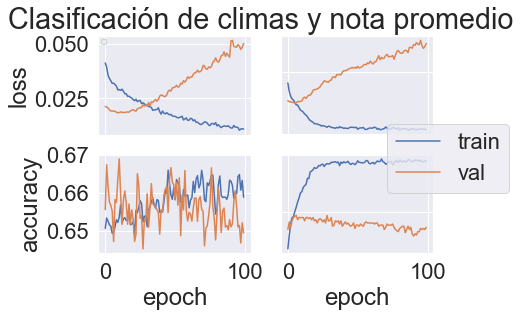

In [224]:
plot_avg(info_final)

In [28]:
n_inputs, n_outputs = x.shape[1], y.shape[1]

In [67]:
# evaluar modelo
modelo = get_model_1(n_inputs, n_outputs, "FF256") # es una red Feed Forward con dim de input 259
info = evaluate_model(modelo, x, y)

Model: "FF256"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF256 (InputLayer)             [(None, 256)]        0           []                               
                                                                                                  
 dense_12 (Dense)               (None, 250)          64250       ['FF256[0][0]']                  
                                                                                                  
 dense_13 (Dense)               (None, 100)          25100       ['dense_12[0][0]']               
                                                                                                  
 dense_14 (Dense)               (None, 50)           5050        ['dense_13[0][0]']               
                                                                                              

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


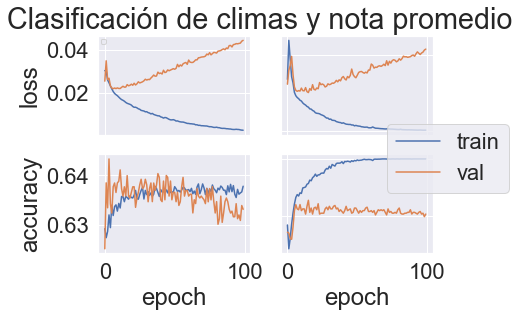

In [130]:
plot_avg(info)

In [62]:
# generar modelo
def get_model_2(n_inputs, n_outputs, name = "all_columns_Conv"):
	p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs, 1), name=name)

	# hlayer1 = layers.Dropout(p_dropout)(inputs)

	hlayer1 = layers.Conv1D(100, 45, input_shape=(1, n_inputs, n_outputs), activation="relu")(inputs)
	hlayer2 = layers.MaxPooling1D(pool_size=4)(hlayer1)
	hlayer3 = layers.Conv1D(30, 5, activation="relu")(hlayer2)
	hlayer4 = layers.MaxPooling1D(pool_size=4)(hlayer1)
	hlayer5 = layers.Flatten()(hlayer4)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer5)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer5)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model

In [128]:
# evaluar modelo
modelo = get_model_2(n_inputs, n_outputs, "Conv256") # es una red Feed Forward con dim de input 259
info = evaluate_model(modelo, x, y)

Model: "Conv256"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Conv256 (InputLayer)           [(None, 256, 1)]     0           []                               
                                                                                                  
 conv1d_12 (Conv1D)             (None, 212, 100)     4600        ['Conv256[0][0]']                
                                                                                                  
 max_pooling1d_5 (MaxPooling1D)  (None, 53, 100)     0           ['conv1d_12[0][0]']              
                                                                                                  
 flatten (Flatten)              (None, 5300)         0           ['max_pooling1d_5[0][0]']        
                                                                                            

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


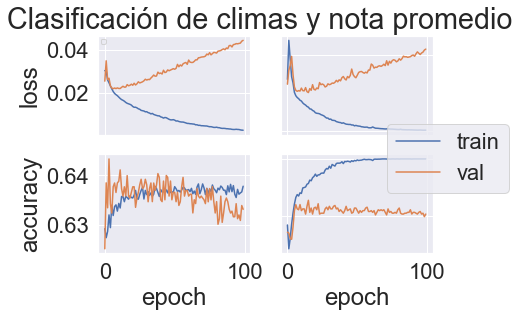

In [131]:
plot_avg(info)

In [63]:
def get_model_3(n_inputs, n_outputs, name = "all_columns_Conv"):
    p_dropout = 0.2
    inputs = keras.Input(shape=(n_inputs, 1), name=name)
    hlayer1 = layers.Conv1D(filters=64, kernel_size=3, activation="relu", input_shape=(1, n_inputs, n_outputs))(inputs)
    hlayer2 = layers.Conv1D(filters=64, kernel_size=3, activation="relu")(hlayer1)
    hlayer3 = layers.Dropout(p_dropout)(hlayer2)
    hlayer4 = layers.MaxPooling1D(pool_size=2)(hlayer3)
    hlayer5 = layers.Flatten()(hlayer4)
    hlayer6 = layers.Dense(10, activation="relu")(hlayer5)
    categoria_clima = Dense(5, activation="sigmoid", name="climas")(hlayer6)
    nota = layers.Dense(5, activation="sigmoid", name="nota")(hlayer6)

    model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
    model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
    model.summary()
    keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

    return model


In [191]:
# evaluar modelo
modelo3 = get_model_3(n_inputs, n_outputs, "Conv_MaxPool_Dropout256") # es una red Feed Forward con dim de input 259
info3 = evaluate_model(modelo3, x, y)

Model: "Conv_MaxPool_Dropout256"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Conv_MaxPool_Dropout256 (Input  [(None, 256, 1)]    0           []                               
 Layer)                                                                                           
                                                                                                  
 conv1d_18 (Conv1D)             (None, 254, 64)      256         ['Conv_MaxPool_Dropout256[0][0]']
                                                                                                  
 conv1d_19 (Conv1D)             (None, 252, 64)      12352       ['conv1d_18[0][0]']              
                                                                                                  
 dropout_2 (Dropout)            (None, 252, 64)      0           ['conv1d_19

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


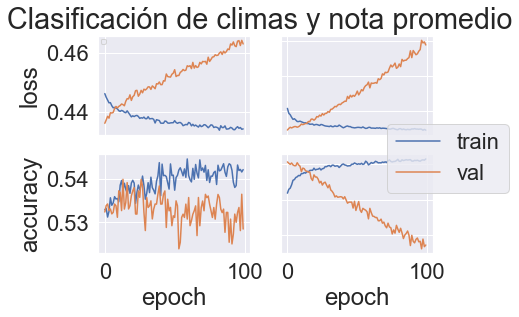

In [192]:
plot_avg(info3)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 70)                6650      
                                                                 
 dropout (Dropout)           (None, 70)                0         
                                                                 
 dense_1 (Dense)             (None, 30)                2130      
                                                                 
 dropout_1 (Dropout)         (None, 30)                0         
                                                                 
 dense_2 (Dense)             (None, 10)                310       
                                                                 
 dropout_2 (Dropout)         (None, 10)                0         
                                                                 
 dense_3 (Dense)             (None, 5)                 5

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


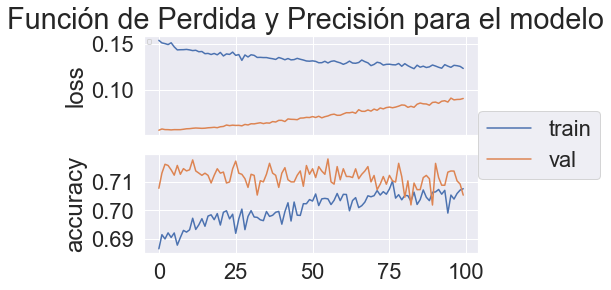

In [42]:
# evaluar modelo
modelo = get_model(n_inputs, n_outputs)
info = evaluate_model(modelo, x, y)
plot_avg(info)

In [43]:
"""
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 8}

plt.rc('font', **font)
plt.rc('xtick', labelsize=12) 
plt.rc('ytick', labelsize=12) 
"""

"\nfont = {'family' : 'normal',\n        'weight' : 'normal',\n        'size'   : 8}\n\nplt.rc('font', **font)\nplt.rc('xtick', labelsize=12) \nplt.rc('ytick', labelsize=12) \n"

In [45]:
def plot(info):

    fig, (ax1, ax2) = plt.subplots(2, sharex=True)
    fig.suptitle('Función de Perdida y Precisión para el modelo')
    ax1.set_ylabel('loss')

    ax1.plot(info.history["loss"])
    ax1.plot(info.history["val_loss"])
    ax1.legend(loc=2, prop={'size': 6})
    fig.legend(['train', 'val'], loc='center right')


    ax2.set_ylabel('accuracy')
    ax2.plot(info.history["accuracy"])
    ax2.plot(info.history["val_accuracy"])

    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


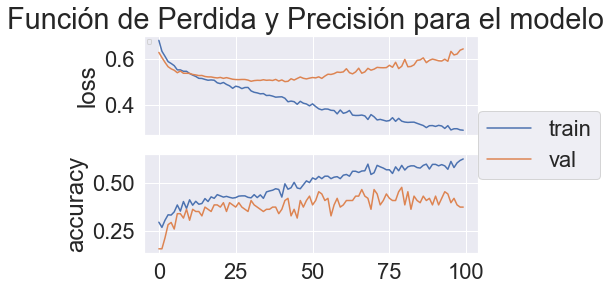

In [46]:
plot(info[0])

In [74]:
# generar modelo
def get_model_4(n_inputs, n_outputs, name = "all_columns_FF_Dropout"):
	p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs,), name=name)
	hlayer1 = layers.Dense(70, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu')(inputs)
	hlayer2 = layers.Dropout(p_dropout, input_shape=(70,))(hlayer1)
	hlayer3 = layers.Dense(30, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu')(hlayer2)
	hlayer4 = layers.Dense(30, input_dim=70, kernel_initializer='he_uniform', activation='relu')(hlayer3)
	hlayer5 = layers.Dropout(p_dropout, input_shape=(30,))(hlayer4)

	hlayer6 = layers.Dense(10, input_dim=30, kernel_initializer='he_uniform', activation='relu')(hlayer5)
	# hlayer7 = layers.Dropout(p_dropout, input_shape=(10,))(hlayer6)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer6)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer6)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model

In [92]:
# evaluar modelo
modelo4 = get_model_4(n_inputs, n_outputs)
info4 = evaluate_model(modelo4, x, y)

Model: "all_columns_FF_Dropout"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 all_columns_FF_Dropout (InputL  [(None, 216)]       0           []                               
 ayer)                                                                                            
                                                                                                  
 dense_28 (Dense)               (None, 70)           15190       ['all_columns_FF_Dropout[0][0]'] 
                                                                                                  
 dropout_17 (Dropout)           (None, 70)           0           ['dense_28[0][0]']               
                                                                                                  
 dense_29 (Dense)               (None, 30)           2130        ['dropout_17

KeyboardInterrupt: 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


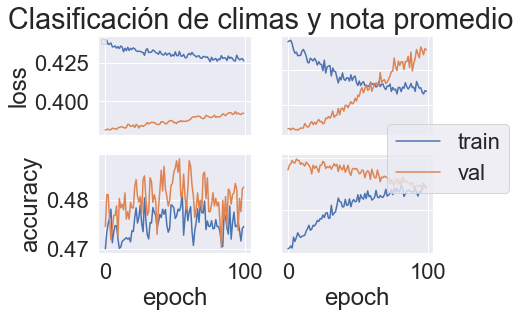

In [59]:
plot_avg(info4)

In [47]:
ELIMINAR_COLUMNAS = [
    "cloth_category_1_1",
    "skirt_1_1",
    "skirt_1_2",
    "skirt_1_3",

    "cloth_subcategory_2_0",
    "patron_2_0",
    "sleeve_2_0",
    "skirt_2_0",
    "skirt_2_1",
    "skirt_2_3",
    "neckline_2_0",
    "material_2_0",
    "fit_2_0",

    "cloth_subcategory_3_0",
    "patron_3_0",
    "sleeve_3_0",
    "skirt_3_0",
    "skirt_3_2",
    "skirt_3_3",
    "neckline_3_0",
    "material_3_0",
    "fit_3_0",

    "cloth_subcategory_4_0",
    "patron_4_0",
    "sleeve_4_0",
    "skirt_4_0",
    "neckline_4_0",
    "material_4_0",
    "fit_4_0",

    "cloth_category_5_5",
    "sleeve_5_0",
    "skirt_5_0",
    "neckline_5_0",

    "cloth_category_6_6",
    "sleeve_6_1",
    "sleeve_6_2",
    "sleeve_6_3",
    "neckline_6_1",
    "neckline_6_2",
    "neckline_6_4",
]

In [48]:
for c in ELIMINAR_COLUMNAS:
    COLUMNAS_ELIMINADAS.append(c)

In [52]:
dummied_df.drop(COLUMNAS_ELIMINADAS, axis = 1, inplace = True)

In [53]:
x = dummied_df.to_numpy()
y = y.to_numpy()

In [60]:
n_inputs, n_outputs = x.shape[1], y.shape[1]

In [228]:
n_inputs

216

In [131]:
modelo5 = get_model_1(n_inputs, n_outputs, name=f"FF{n_inputs}")


Model: "FF216"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF216 (InputLayer)             [(None, 216)]        0           []                               
                                                                                                  
 dense_56 (Dense)               (None, 250)          54250       ['FF216[0][0]']                  
                                                                                                  
 dense_57 (Dense)               (None, 100)          25100       ['dense_56[0][0]']               
                                                                                                  
 dense_58 (Dense)               (None, 50)           5050        ['dense_57[0][0]']               
                                                                                              

In [132]:
info5 = evaluate_model(modelo5, x, y)

Epoch 1/100
25/25 - 1s - loss: 2.1958 - climas_loss: 0.6176 - nota_loss: 1.5782 - climas_accuracy: 0.4471 - nota_accuracy: 0.2573 - val_loss: 2.0834 - val_climas_loss: 0.5773 - val_nota_loss: 1.5061 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2614 - 870ms/epoch - 35ms/step
Epoch 2/100
25/25 - 0s - loss: 2.0055 - climas_loss: 0.5598 - nota_loss: 1.4457 - climas_accuracy: 0.4599 - nota_accuracy: 0.3389 - val_loss: 2.0405 - val_climas_loss: 0.5518 - val_nota_loss: 1.4887 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.3636 - 81ms/epoch - 3ms/step
Epoch 3/100
25/25 - 0s - loss: 1.8801 - climas_loss: 0.5373 - nota_loss: 1.3429 - climas_accuracy: 0.4599 - nota_accuracy: 0.4089 - val_loss: 1.9516 - val_climas_loss: 0.5349 - val_nota_loss: 1.4167 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.4205 - 93ms/epoch - 4ms/step
Epoch 4/100
25/25 - 0s - loss: 1.7461 - climas_loss: 0.5227 - nota_loss: 1.2234 - climas_accuracy: 0.4497 - nota_accuracy: 0.5146 - val_loss: 1.9584 - val_

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


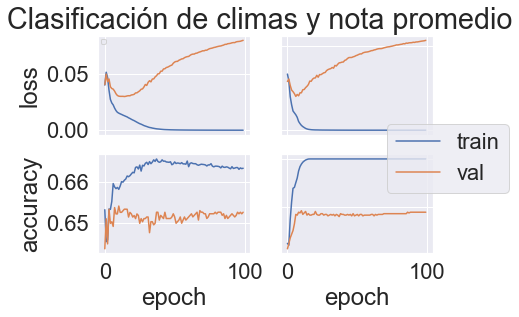

In [133]:
plot_avg(info5)

In [68]:
modelo6 = get_model_2(n_inputs, n_outputs, name=f"Conv1D{n_inputs}")
info6 = evaluate_model(modelo6, x, y)

Model: "Conv1D216"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Conv1D216 (InputLayer)         [(None, 216, 1)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 172, 100)     4600        ['Conv1D216[0][0]']              
                                                                                                  
 max_pooling1d_1 (MaxPooling1D)  (None, 43, 100)     0           ['conv1d[0][0]']                 
                                                                                                  
 flatten (Flatten)              (None, 4300)         0           ['max_pooling1d_1[0][0]']        
                                                                                          

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


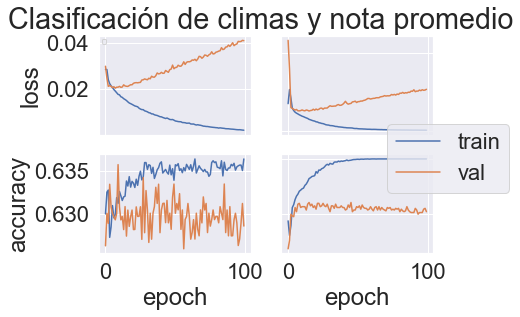

In [69]:
plot_avg(info6)

In [70]:
modelo7 = get_model_3(n_inputs, n_outputs, name=f"Estandar_Conv1D{n_inputs}")
info7 = evaluate_model(modelo7, x, y)

Model: "Estandar_Conv1D216"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Estandar_Conv1D216 (InputLayer  [(None, 216, 1)]    0           []                               
 )                                                                                                
                                                                                                  
 conv1d_2 (Conv1D)              (None, 214, 64)      256         ['Estandar_Conv1D216[0][0]']     
                                                                                                  
 conv1d_3 (Conv1D)              (None, 212, 64)      12352       ['conv1d_2[0][0]']               
                                                                                                  
 dropout_6 (Dropout)            (None, 212, 64)      0           ['conv1d_3[0][0]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


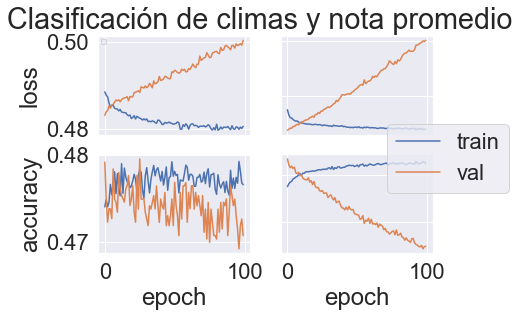

In [71]:
plot_avg(info7)

In [75]:
modelo8 = get_model_4(n_inputs, n_outputs, name=f"FF_Dropout{n_inputs}")
info8 = evaluate_model(modelo8, x, y)

Model: "FF_Dropout216"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF_Dropout216 (InputLayer)     [(None, 216)]        0           []                               
                                                                                                  
 dense_16 (Dense)               (None, 70)           15190       ['FF_Dropout216[0][0]']          
                                                                                                  
 dropout_10 (Dropout)           (None, 70)           0           ['dense_16[0][0]']               
                                                                                                  
 dense_17 (Dense)               (None, 30)           2130        ['dropout_10[0][0]']             
                                                                                      

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


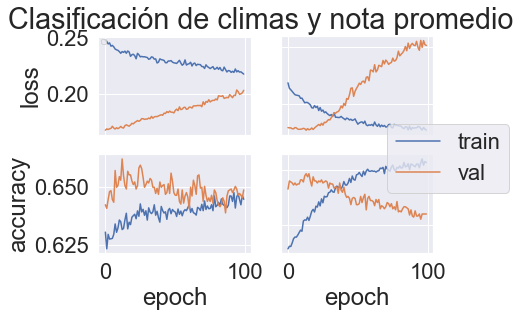

In [86]:
plot_avg(info8)

In [87]:
# generar modelo
def get_model_5(n_inputs, n_outputs, name = "all_columns_FF_Dropout"):
	p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs,), name=name)
	hlayer1 = layers.Dense(150, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu')(inputs)
	hlayer2 = layers.Dropout(p_dropout, input_shape=(150,))(hlayer1)
	hlayer3 = layers.Dense(100, input_dim=150, kernel_initializer='he_uniform', activation='relu')(hlayer2)
	hlayer4 = layers.Dropout(p_dropout, input_shape=(100,))(hlayer3)

	hlayer5 = layers.Dense(50, input_dim=100, kernel_initializer='he_uniform', activation='relu')(hlayer4)

	hlayer6 = layers.Dropout(p_dropout, input_shape=(50,))(hlayer5)
	hlayer7 = layers.Dense(10, input_dim=50, kernel_initializer='he_uniform', activation='relu')(hlayer6)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer6)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer6)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model

In [89]:
modelo8 = get_model_5(n_inputs, n_outputs, name=f"FF_Dropout{n_inputs}")

Model: "FF_Dropout216"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF_Dropout216 (InputLayer)     [(None, 216)]        0           []                               
                                                                                                  
 dense_24 (Dense)               (None, 150)          32550       ['FF_Dropout216[0][0]']          
                                                                                                  
 dropout_14 (Dropout)           (None, 150)          0           ['dense_24[0][0]']               
                                                                                                  
 dense_25 (Dense)               (None, 100)          15100       ['dropout_14[0][0]']             
                                                                                      

In [90]:
info8 = evaluate_model(modelo8, x, y)

Epoch 1/100
25/25 - 1s - loss: 2.3889 - climas_loss: 0.7198 - nota_loss: 1.6691 - climas_accuracy: 0.2522 - nota_accuracy: 0.2446 - val_loss: 2.2519 - val_climas_loss: 0.6517 - val_nota_loss: 1.6002 - val_climas_accuracy: 0.4091 - val_nota_accuracy: 0.2159 - 1s/epoch - 41ms/step
Epoch 2/100
25/25 - 0s - loss: 2.2078 - climas_loss: 0.6264 - nota_loss: 1.5814 - climas_accuracy: 0.4089 - nota_accuracy: 0.2484 - val_loss: 2.1846 - val_climas_loss: 0.6159 - val_nota_loss: 1.5687 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2500 - 161ms/epoch - 6ms/step
Epoch 3/100
25/25 - 0s - loss: 2.1738 - climas_loss: 0.6001 - nota_loss: 1.5737 - climas_accuracy: 0.4548 - nota_accuracy: 0.2522 - val_loss: 2.1435 - val_climas_loss: 0.5842 - val_nota_loss: 1.5592 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2386 - 141ms/epoch - 6ms/step
Epoch 4/100
25/25 - 0s - loss: 2.0995 - climas_loss: 0.5798 - nota_loss: 1.5197 - climas_accuracy: 0.4522 - nota_accuracy: 0.2904 - val_loss: 2.1080 - val_c

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


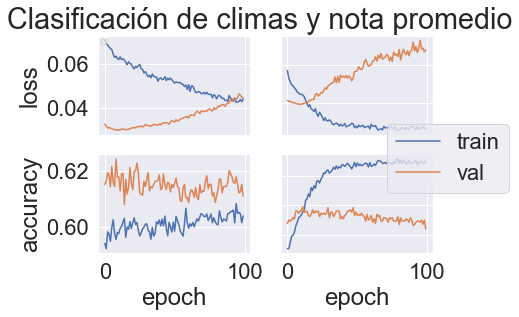

In [91]:
plot_avg(info8)

In [94]:
x.shape

(873, 216)

In [100]:
print('Columna\t','# de Ocurrencias')
remove = []
for col in dummied_df:
    count= 0
    
    if(len(dummied_df[col].value_counts()) >1):
        count = dummied_df[col].value_counts()[1]
        
    if count < 25:
        # print(col,'\t',count)
        remove.append(col)
print(len(remove))
# dummied_df.drop(remove, axis = 1, inplace = True)

Columna	 # de Ocurrencias
45


In [103]:
dummied_df.drop(remove, axis=1, inplace = True)

In [104]:
x3 = dummied_df.to_numpy()

In [117]:
n_inputs3 = x3.shape[1]
n_inputs3

171

In [109]:
# generar modelo
def get_model_10(n_inputs, n_outputs, name = "all_columns_FF"):
	# p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs,), name=name)
	
	hlayer1 = layers.Dense(150, activation='relu')(inputs)
	hlayer2 = layers.Dense(100, activation='relu')(hlayer1)
	hlayer3 = layers.Dense(50, activation='relu')(hlayer2)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer3)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer3)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model
	"""

	model = Sequential()
	model.add(Dense(70, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(70,)))

	# model.add(Dense(30, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dense(30, input_dim=70, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(30,)))

	model.add(Dense(10, input_dim=30, kernel_initializer='he_uniform', activation='relu'))
	model.add(Dropout(p_dropout, input_shape=(10,)))

	model.add(Dense(n_outputs, activation='sigmoid'))
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics="accuracy")
	model.summary()
	"""

In [110]:
modelo10 = get_model_10(n_inputs3, n_outputs, f"FF{n_inputs3}")

Model: "FF171"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 FF171 (InputLayer)             [(None, 171)]        0           []                               
                                                                                                  
 dense_35 (Dense)               (None, 150)          25800       ['FF171[0][0]']                  
                                                                                                  
 dense_36 (Dense)               (None, 100)          15100       ['dense_35[0][0]']               
                                                                                                  
 dense_37 (Dense)               (None, 50)           5050        ['dense_36[0][0]']               
                                                                                              

In [111]:
info10 = evaluate_model(modelo10, x3, y)

Epoch 1/100
25/25 - 1s - loss: 2.1913 - climas_loss: 0.6202 - nota_loss: 1.5711 - climas_accuracy: 0.4611 - nota_accuracy: 0.2561 - val_loss: 2.1307 - val_climas_loss: 0.6017 - val_nota_loss: 1.5290 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2614 - 801ms/epoch - 32ms/step
Epoch 2/100
25/25 - 0s - loss: 2.0422 - climas_loss: 0.5702 - nota_loss: 1.4721 - climas_accuracy: 0.4599 - nota_accuracy: 0.3350 - val_loss: 2.0721 - val_climas_loss: 0.5811 - val_nota_loss: 1.4910 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2955 - 88ms/epoch - 4ms/step
Epoch 3/100
25/25 - 0s - loss: 1.9257 - climas_loss: 0.5516 - nota_loss: 1.3741 - climas_accuracy: 0.4599 - nota_accuracy: 0.4064 - val_loss: 2.0474 - val_climas_loss: 0.5625 - val_nota_loss: 1.4849 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2841 - 77ms/epoch - 3ms/step
Epoch 4/100
25/25 - 0s - loss: 1.8353 - climas_loss: 0.5366 - nota_loss: 1.2987 - climas_accuracy: 0.4611 - nota_accuracy: 0.4790 - val_loss: 2.0902 - val_

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


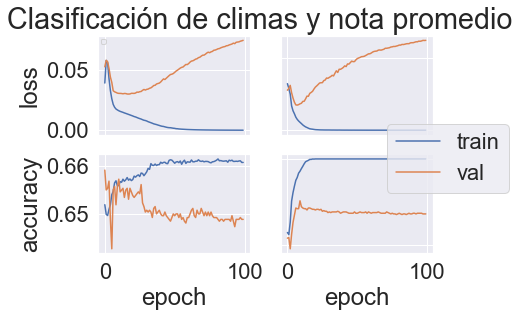

In [112]:
plot_avg(info10)

In [123]:
# generar modelo
def get_model_11(n_inputs, n_outputs, name = "all_columns_FF"):
	# p_dropout = 0.2

	inputs = keras.Input(shape=(n_inputs,), name=name)
	
	hlayer1 = layers.Dense(200, activation='relu')(inputs)
	hlayer2 = layers.Dense(100, activation='relu')(hlayer1)
	hlayer3 = layers.Dense(50, activation='relu')(hlayer2)

	categoria_clima = Dense(5, activation='sigmoid', name='climas')(hlayer3)
	nota = Dense(5, activation='sigmoid', name='nota')(hlayer3)
	
	model = keras.Model(inputs=inputs, outputs=[categoria_clima, nota], name=name)
	
	model.compile(loss={'climas':'binary_crossentropy', 'nota':'categorical_crossentropy'}, optimizer='adam', metrics="accuracy")
	model.summary()
	keras.utils.plot_model(model, show_shapes=True, to_file=f"{name}.png")

	return model

In [124]:
modelo11 = get_model_11(n_inputs3, n_outputs, "Modelo_11")

Model: "Modelo_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Modelo_11 (InputLayer)         [(None, 171)]        0           []                               
                                                                                                  
 dense_47 (Dense)               (None, 200)          34400       ['Modelo_11[0][0]']              
                                                                                                  
 dense_48 (Dense)               (None, 100)          20100       ['dense_47[0][0]']               
                                                                                                  
 dense_49 (Dense)               (None, 50)           5050        ['dense_48[0][0]']               
                                                                                          

In [125]:
info11 = evaluate_model(modelo11, x3, y)

Epoch 1/100
25/25 - 1s - loss: 2.1951 - climas_loss: 0.6071 - nota_loss: 1.5879 - climas_accuracy: 0.3427 - nota_accuracy: 0.2318 - val_loss: 2.1474 - val_climas_loss: 0.5893 - val_nota_loss: 1.5581 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2273 - 897ms/epoch - 36ms/step
Epoch 2/100
25/25 - 0s - loss: 2.0545 - climas_loss: 0.5709 - nota_loss: 1.4836 - climas_accuracy: 0.4599 - nota_accuracy: 0.3376 - val_loss: 2.1327 - val_climas_loss: 0.5881 - val_nota_loss: 1.5446 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2045 - 83ms/epoch - 3ms/step
Epoch 3/100
25/25 - 0s - loss: 1.9499 - climas_loss: 0.5599 - nota_loss: 1.3900 - climas_accuracy: 0.4599 - nota_accuracy: 0.4115 - val_loss: 2.0811 - val_climas_loss: 0.5891 - val_nota_loss: 1.4920 - val_climas_accuracy: 0.4205 - val_nota_accuracy: 0.2273 - 82ms/epoch - 3ms/step
Epoch 4/100
25/25 - 0s - loss: 1.8206 - climas_loss: 0.5457 - nota_loss: 1.2749 - climas_accuracy: 0.4599 - nota_accuracy: 0.4803 - val_loss: 1.9679 - val_

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


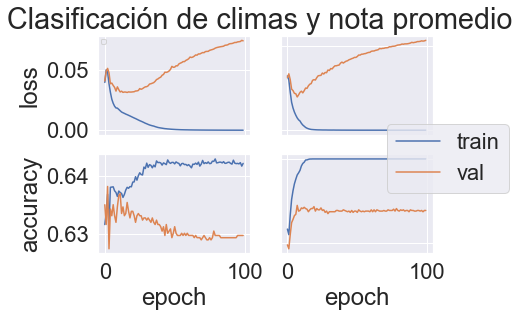

In [126]:
plot_avg(info11)

In [233]:
def guardar_columnas_eliminadas(ruta):
    file = open(ruta, "w")
    for columna in COLUMNAS_ELIMINADAS:
        file.write(f"{columna}\n")
    file.close()

def guardar_modelo(modelo, nombre):
    RUTA = "../Algoritmo Genético/modelos/"
    filepath = f"{RUTA}/{nombre}/{nombre}.h5"
    modelo.save(
        filepath,
        overwrite=True,
        include_optimizer=True,
        save_format=None,
        signatures=None,
        options=None,
        save_traces=True,
    )
    guardar_columnas_eliminadas(f"{RUTA}/{nombre}/columnas_elimindas.txt")

In [234]:
guardar_modelo(modelo, "ClasificadorNeuronal")